## Importing Libraries

In [ ]:
import torch
from PIL import Image
import glob
import torchvision
import cv2
import random
import matplotlib.pyplot as plt
import torch.nn as nn
#from scipy.stats import wasserstein_distance`
import torch.nn.functional as F
import progressbar
from sklearn import metrics
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import pylab
import random
import requests
import math
import os
import time
import json
import gc
from torchsummary import summary
import pycuda.driver as cuda
from io import StringIO,BytesIO

C:\Users\MOHIT\anaconda3\envs\deepLeArning\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\MOHIT\anaconda3\envs\deepLeArning\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Data gathering and organization

## Downloading COCO dataset

In [ ]:
def resize_image(image,bbox,dim=256):
    w,h = image.size
    w_ratio = w / dim
    h_ratio = h/dim
    bbox[0] = bbox[0]/w_ratio
    bbox[1] = bbox[1]/h_ratio
    bbox[2] = bbox[2]/w_ratio
    bbox[3] = bbox[3]/h_ratio
    image = image.resize((dim,dim))
    return image, bbox

def download_from_coco(annFile, categories, img_dim=256):
    coco=COCO(annFile)
    image_annotations = []
    i=0
    start = time.time()
    catIds = coco.getCatIds(catNms=categories)
    print(catIds)
    imgIds = []
    for catId in catIds: imgIds.extend(coco.getImgIds(catIds=catId ))
    print(f"Number of images for {categories}  = {len(imgIds)} \n")
    print(f"Selecting {len(imgIds)} {train_or_val} image\n")

    bar = progressbar.ProgressBar()
    for img_idx in bar(range(len(imgIds))):
        #for img_idx in bar(range(len(img_idxs))):
        img = coco.loadImgs(imgIds[img_idx])[0]
        annId = coco.getAnnIds(imgIds = img['id'], catIds=catIds , iscrowd=False)
        annss = coco.loadAnns(annId)
        obj_desc = []

        img_url = img['coco_url']
        img_data = requests.get(img_url).content
        try:
            img_data = Image.open(BytesIO(img_data))
        except:
            print(f"An exception occurred for img index{img_idx}")
            continue
        w_org,h_org = img_data.size
        img_data = img_data.resize((img_dim,img_dim))
        w_ratio = w_org /img_dim
        h_ratio = h_org /img_dim


        if not os.path.exists(f"{train_or_val}"):
           # Create a new directory because it does not exist
           os.makedirs(f"{train_or_val}")

        img_data.save(f'{train_or_val}/{img["id"]}.jpg')

        flag = 0
        for ann in annss:
            if ann['area'] < 4096:
                flag = 1
                #print(f"Area was {ann}")
                break
            bbox = ann['bbox']
            bbox[0] = bbox[0]/w_ratio
            bbox[1] = bbox[1]/h_ratio
            bbox[2] = bbox[2]/w_ratio
            bbox[3] = bbox[3]/h_ratio
            obj_desc.append({'b_box' : bbox ,'category_id': ann['category_id']})

        if flag==1:continue
        image_annotation = {"img_id": img['id'] , 'ann_id' : annId , 'objects' : obj_desc ,
                                     "img_h" : img['height'],"img_w":img['width']}
        image_annotations.append(image_annotation)
    end = time.time()
    print(f"Images for {categories} downloaded in {round((end-start)/60 , 3)} minutes\n")

    with open(f'{train_or_val}_annotations.json', 'w') as fout:
        json.dump(image_annotations, fout)
    return image_annotations

In [ ]:
download_data = False
if download_data:
    train_or_val = 'train'
    dataType=f'{train_or_val}2014'
    annFile=f"../HW4/annotations/instances_{dataType}.json"
    categories = ['bus', 'pizza', 'cat']

    image_annotations_train = download_from_coco(annFile,categories)

    categories = ['bus', 'pizza', 'cat']
    train_or_val = 'val'
    dataType=f'{train_or_val}2014'
    annFile=f"../HW4/annotations/instances_{dataType}.json"
    print(annFile)
    #categories = ['bus', 'pizza', 'cat']
    #coco=COCO(annFile)
    image_annotations_val = download_from_coco(annFile,categories)

## Reading data

In [ ]:
classes = ['bus', 'pizza', 'cat']
img_annotations_train = json.load(open('train_annotations.json'))
print(f"Number of Training Images {len(img_annotations_train)}")
img_annotations_val = json.load(open('val_annotations.json'))
print(f"Number of Testing Images {len(img_annotations_val)}")

i=0
category_map = json.load(open('classMap_annotations.json'))
#print(category_map)
class_map = {}
class_map_rev = {}
class_cat_id_map_rev = {}
for clas in classes:
    class_map[category_map[clas]]=np.zeros(len(classes))
    class_map[category_map[clas]][i] = 1
    class_map_rev[i] = clas
    class_cat_id_map_rev[category_map[clas]] = clas
    i=i+1
#print(f"class map = {class_map}")
#print(f"class map rev = {class_map_rev}")
#print(class_cat_id_map_rev)

# {'bus': 6, 'pizza': 59, 'cat': 17}

Number of Training Images 6192
Number of Testing Images 3177


## Images in the training dataset

Training Images


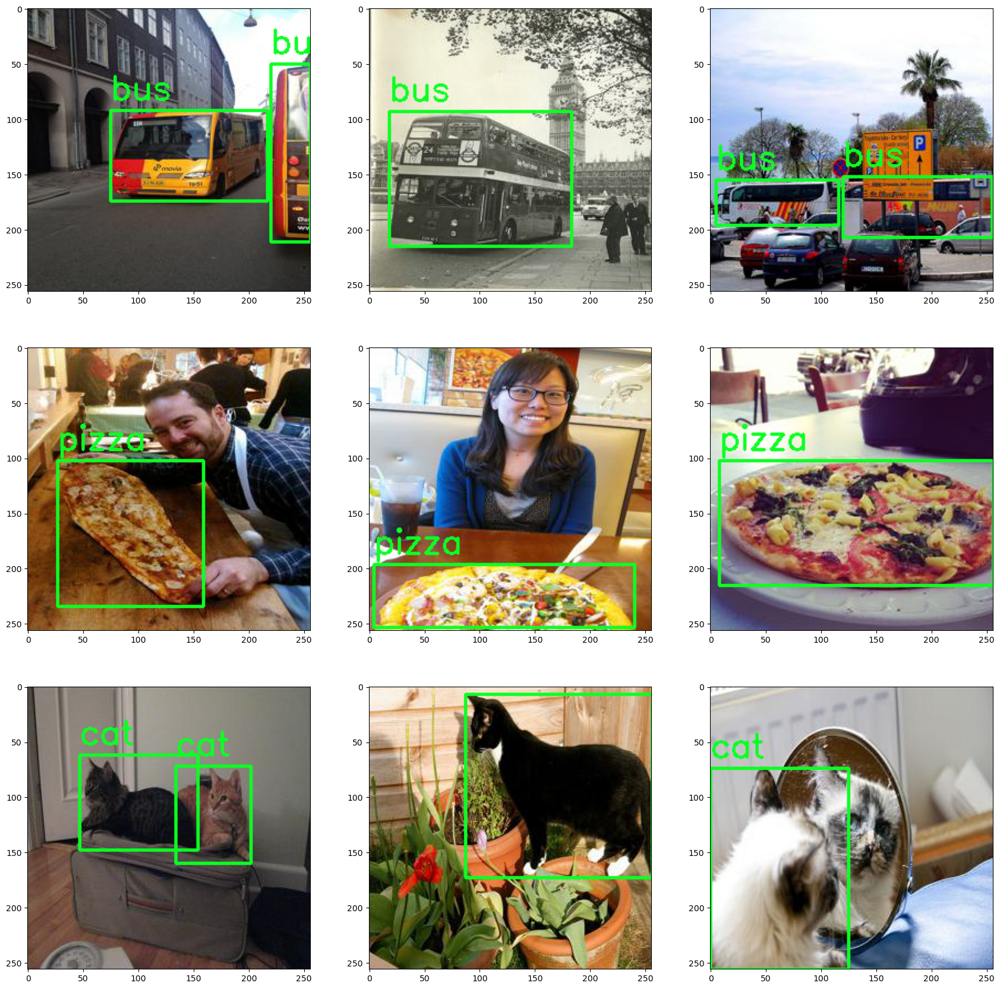

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(21, 21))
col = 0
class_counter = [0, 0, 0]
random_numbers = random.sample(range(1, len(img_annotations_train)), 100)
for random_number in random_numbers:
    item = img_annotations_train[random_number]
    if item['objects'][0]['category_id'] == 6 and class_counter[0]<3:
        col = class_counter[0]
        class_counter[0] += 1
        row=0
    elif item['objects'][0]['category_id'] == 59 and class_counter[1]<3:
        col = class_counter[1]
        class_counter[1] += 1
        row=1
    elif item['objects'][0]['category_id'] == 17 and class_counter[2]<3:
        col = class_counter[2]
        class_counter[2] += 1
        row=2
    else: continue

    image = cv2.imread(f'train/{item["img_id"]}.jpg')
    #image = cv2.resize(image,(256,256))
    for object1 in item['objects']:
        #print(object1)
        [x , y , w , h] = object1['b_box']
        image = cv2.rectangle ( image , (int( x ) , int( y ) ) , (int( x + w ) , int ( y + h ) ) , ( 36 , 255 , 12 ) , 2 )
        image = cv2.putText ( image , class_cat_id_map_rev[object1['category_id']] , (int( x ) , int( y - 10 ) ) , cv2.FONT_HERSHEY_SIMPLEX , 1,( 36 , 255 , 12 ) , 2 )
    ax[row , col].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    #col = col+1
    if sum(class_counter) == 9:
        break
print("Training Images")
plt.show()

## Images in the Validation dataset

Validation Images


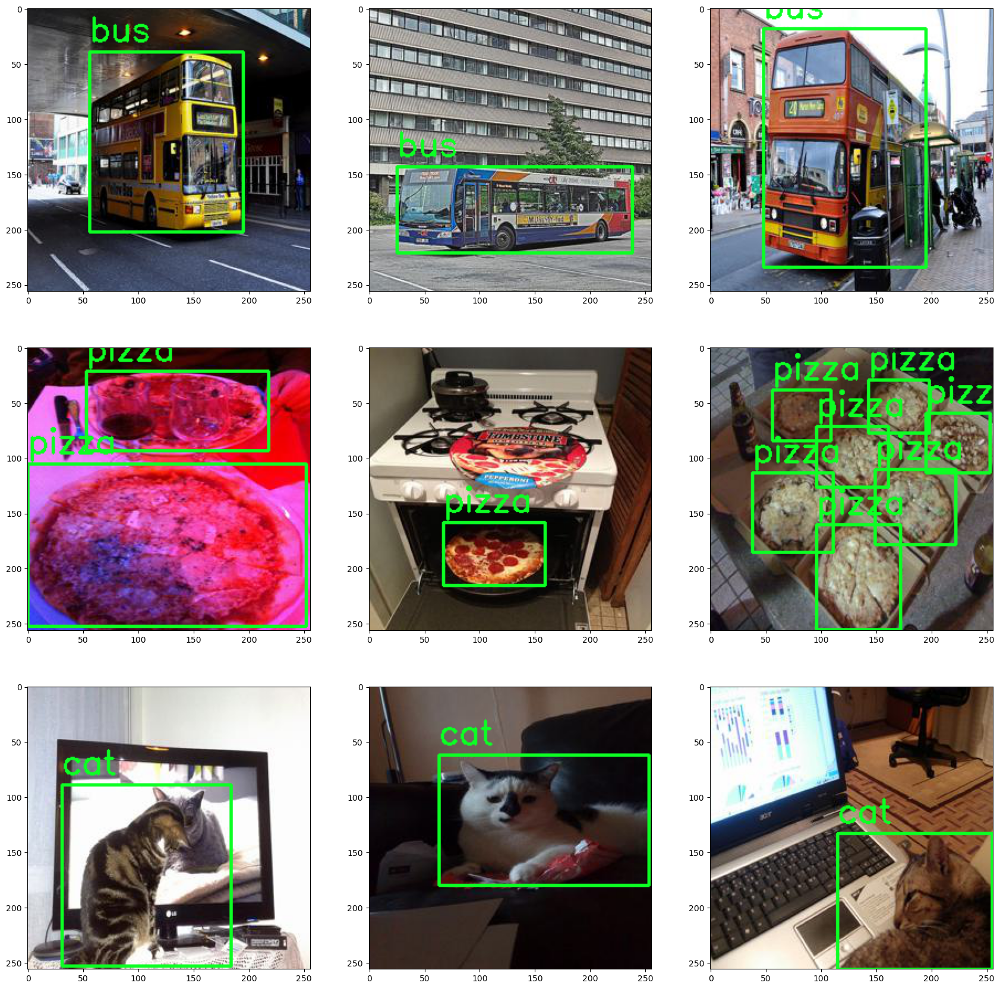

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(21, 21))
col = 0
class_counter = [0, 0, 0]
random_numbers = random.sample(range(1, len(img_annotations_val)), 100)
for random_number in random_numbers:
    item = img_annotations_val[random_number]
    if item['objects'][0]['category_id'] == 6 and class_counter[0]<3:
        col = class_counter[0]
        class_counter[0] += 1
        row=0
    elif item['objects'][0]['category_id'] == 59 and class_counter[1]<3:
        col = class_counter[1]
        class_counter[1] += 1
        row=1
    elif item['objects'][0]['category_id'] == 17 and class_counter[2]<3:
        col = class_counter[2]
        class_counter[2] += 1
        row=2
    else: continue

    image = cv2.imread(f'val/{item["img_id"]}.jpg')
    #image = cv2.resize(image,(256,256))
    for object1 in item['objects']:
        #print(object1)
        [x , y , w , h] = object1['b_box']
        image = cv2.rectangle ( image , (int( x ) , int( y ) ) , (int( x + w ) , int ( y + h ) ) , ( 36 , 255 , 12 ) , 2 )
        image = cv2.putText ( image , class_cat_id_map_rev[object1['category_id']] , (int( x ) , int( y - 10 ) ) , cv2.FONT_HERSHEY_SIMPLEX , 1,( 36 , 255 , 12 ) , 2 )
    ax[row , col].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    #col = col+1
    if sum(class_counter) == 9:
        break
print("Validation Images")
plt.show()

# YOLO Intuition

The intuition behind YOLO is to detect objects in an image in a **single forward pass** through a neural network. Traditional object detection algorithms like R-CNN and its variants typically take a multi-stage approach where an object proposal mechanism is first used to generate a set of candidate regions in an image, which are then classified and refined to detect the final objects.

In contrast, YOLO takes a single-shot approach where an entire image is input to the network at once and the network outputs a grid of bounding boxes and class probabilities for each grid cell. This grid is typically divided into a fixed number of cells, and each cell is responsible for detecting objects that fall within it. The bounding boxes predicted by YOLO are also unique in that they are predicted relative to the cell in which they appear, rather than relative to the entire image.

To improve the accuracy of object detection, YOLO uses **anchor boxes**. Anchor boxes are pre-defined bounding boxes of different shapes and sizes that are used to predict the location and size of objects in the image. The idea behind anchor boxes is that different objects may have different aspect ratios and sizes, and by using a set of anchor boxes with different aspect ratios and sizes, YOLO can better capture the variation in object shapes and sizes.

During training, the algorithm learns to adjust the anchor boxes to better fit the objects in the image. Each anchor box is associated with a specific cell in the grid, and during inference, the algorithm predicts the location and size of the objects based on the anchor boxes that best fit the objects in each cell.

# Dataset class

The dataset class is a very important part of the code because I am making the *yolo_tensor* in the dataset class and this is what is returned by my *__getitem()__* function.

In the dataset class, using the annotation each image is read and for every object a *yolo_vector* is created. A *yolo_vector* has $5+C$ elements.  
The first $5$ elements of the yolo_vector are $\begin{bmatrix} p_c & \delta_x & \delta_y & \sigma_w & \sigma_h \end{bmatrix}$ where,  
$p_c$ = probability an element is there.  
$\delta_x , \delta_y$ = offset of the center of true bounding box from center of a cell w.r.t length of cell.  
$\sigma_w , \sigma_h$ = ratio of width and height of the anchorbox and true bounding box.

The last $C$ elements (where $C$ = number of classes) are the class labels for a particular object which are one hot encoded.

This yolo_vector lies in the heart of the algorithm. Using a bunch of yolo_vectors specifically as many as there are objects in an image the *yolo_tensor* is formed.

As we know that the image in YOLO is divided in a number of cells and each cell has a number of anchor boxes associated with it. The yolo_vector for an object is associated to a particualr cell and a particular anchor box. This would make the **yolo_tensor's** dimensions $\begin{bmatrix} X_c & Y_c & A & 5+C \end{bmatrix}$ where,  
$X_c , Y_c$ = Number of cell row and columns in which the image is divided.  
$A$ = number of anchor boxes.  
$5+C$ = The yolo_vector.

So the yolo_vector is iniliatized with all zeros. Using the co-ordiantes of true bounding boxes for each object the values of $X_c$ and $Y_c$ are calculated. The anchor box that is best suited for the object is chosen based on which one has the highest *iou* with the true bouding box.

### what is iou ?

Mathematically, IOU can be expressed as:

$$IOU=\frac{Area_{intersection}(B_{anchor},B_{gt})}{Area_{union}(B_{anchor},B_{gt})}$$

where $B_{anchor}$ is the anchor box, $B_{gt}$ is the ground truth bounding box, $Area_{intersection}$ is the area of the intersection between the two boxes, and $Area_{union}$ is the area of the union between the two boxes.

To compute $Area_{intersection}$, we can first calculate the coordinates of the intersection between the two boxes, which is the region that they both cover. We then calculate the area of this intersection region.

To compute $Area_{union}$, we can add the areas of the anchor box and ground truth bounding boxes, and subtract the area of their intersection:

$$Area_{union}(B_{anchor},B_{gt}) = Area(B_{anchor}) + Area(B_{gt}) - Area_{intersection}(B_{anchor},B_{gt})$$

### What anchor boxes do I make ?

I create *11* anchor boxes of the size $il_c \times jl_c$ where I chnage the value of $i,j$ from 1 to 5 so that these anchor boxes have varying aspect ratios. $l_c$ is the length/size of each cell.

In [ ]:
class myDataset(torch.utils.data.Dataset):
    def __init__(self,root,img_annotations,cell_length, category_to_OHE , anchor_boxes):
        """
        root : directory of the images
        """
        super().__init__()
        self.preprocess = torchvision.transforms.Compose([
        #tvt.ToPILImage(),
        torchvision.transforms.ToTensor(),
        #tvt.Normalize([0,0,0],[1,1,1])
        ])
        self.img_attr = img_annotations
        self.data = []
        #self.root = "/content/drive/MyDrive/Deep_Learning/HW5/"+ root
        self.root =  root
        #self.classes = classes
        #self.read_images()
        self.labels = category_to_OHE
        self.cell_length = cell_length
        self.num_cells = int(256/cell_length)
        self.anchor_boxes = anchor_boxes
        print(f"Number of cells in row and col = {self.num_cells}")
        print(f"Cell length = {self.cell_length}")
        print(f"Number of total yolo cells = {self.num_cells**2}")


    def __len__(self):
        return len(self.img_attr)

    def __getitem__(self,index):
        image = Image.open(f"{self.root}/{self.img_attr[index]['img_id']}.jpg")
        img_np =  np.array(image)
        flag=False
        if img_np.ndim == 2:
            #print(f"{index} : B & W")
            rgbimg = Image.new("RGB", image.size)
            rgbimg.paste(image)
            image = rgbimg
            #flag=True
        yolo_tensor = torch.zeros(self.num_cells, self.num_cells,len(self.anchor_boxes) , (len(self.labels)+5))

        #print(f"yolo_tensor = {yolo_tensor}")
        #print(f"yolo_tensor shape = {yolo_tensor.shape}")
        cell_length = self.cell_length
        objects = self.img_attr[index]['objects']
        image_tensor = self.preprocess(image).float()
        for object1 in objects:
            bbox = object1['b_box'] # top left x , y , w, h
            label = self.labels[object1['category_id']]
            #self.labels[self.class_str_to_num[self.img_attr[index]['class']]]

            b_box_center_x , b_box_center_y = [bbox[0] + bbox[2]/2 , bbox[1]+bbox[3]/2]
            #print(b_box_center_x , b_box_center_y)


            # getting the cell index
            cell_x , cell_y = [self.find_cell_number(b_box_center_x,self.num_cells,cell_length) , self.find_cell_number(b_box_center_y,self.num_cells,cell_length)]
            if cell_x == None:
                print(b_box_center_x)
                _ = self.find_cell_number(b_box_center_x,self.num_cells, True)
            if cell_y == None:
                print(b_box_center_y)
                _ = self.find_cell_number(b_box_center_y,self.num_cells, True)
            #print(cell_x , cell_y)


            # getting the anchor box index
            all_ious = [self.iou_width_height(anchor_box,(bbox[2],bbox[3])) for anchor_box in self.anchor_boxes]
            #print(all_ious)
            #print(all_ious.index(max(all_ious)))
            #print(f"Anchor box size = {self.anchor_boxes[all_ious.index(max(all_ious))]}, GT BB size = {(bbox[2], bbox[3])}")

            anchor_box_index = all_ious.index(max(all_ious))
            #now making the yolo vector

            delta_center_x = ((cell_length*cell_x + cell_length/2) - b_box_center_x)/cell_length
            delta_center_y = ((cell_length*cell_y + cell_length/2) - b_box_center_y)/cell_length

            anchor_box_ratio_w = bbox[2] / self.anchor_boxes[anchor_box_index][0]
            anchor_box_ratio_h = bbox[3] / self.anchor_boxes[anchor_box_index][1]

            yolo_vector = [1 , delta_center_x , delta_center_y , anchor_box_ratio_w, anchor_box_ratio_h ]
            yolo_vector.extend(label)


            #print(f" cell={(cell_x,cell_y)} anchor_box={anchor_box_index} yolo_vector={yolo_vector}")
            yolo_tensor[cell_x][cell_y][anchor_box_index] = torch.tensor(yolo_vector)

        #if index%200==0 or flag:
        #    print(f"{index} : {image_tensor.shape}")
        return image_tensor,yolo_tensor

    @staticmethod
    def find_cell_number(x,num_cells,cell_length,debug=False):
        for i in range(num_cells):
            if debug: print(i)
            if x>=(cell_length*i) and x<=(cell_length*(i+1)):
                #if debug: print(num_cells*(i+1) + num_cells/2 ,"       ", num_cells*i + num_cells/2)
                #if x-(num_cells*i + num_cells/2) < (num_cells*(i+1) + num_cells/2)-x:
                return i
                #else: return i+1

    #found this online
    @staticmethod
    def iou_width_height(boxes1, boxes2):
        """
        Parameters:
            boxes1 (tensor): width and height of the first bounding boxes
            boxes2 (tensor): width and height of the second bounding boxes
        Returns:
            tensor: Intersection over union of the corresponding boxes
        """
        #print(f" box1 = {boxes1} box2 = {boxes2}")
        intersection = min(boxes1[0],boxes2[0]) * min(boxes1[1],boxes2[1])
        union = boxes1[0]*boxes1[1] + boxes2[0]*boxes2[1] - intersection
        #print(f"intersection = {intersection} Union = {union}")
        return intersection / union

## Network Architecture

To make my network I have used this residualblock class which is my skip connection block. Below I am printing a pictorial representation of my network.

In [ ]:
class ResidualBlock(torch.nn.Module):
    """ Helper Class"""
    #self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    def __init__(self, channels):
        self.channels = channels
        super(ResidualBlock, self).__init__()
        self.block = torch.nn.Sequential(
                torch.nn.Conv2d(in_channels=channels[0],
                                out_channels=channels[1],
                                kernel_size=(3, 3),
                                stride=(2, 2),
                                padding=1),
                torch.nn.BatchNorm2d(channels[1]),
                torch.nn.ReLU(inplace=True),
                torch.nn.Conv2d(in_channels=channels[1],
                                out_channels=channels[2],
                                kernel_size=(1, 1),
                                stride=(1, 1),
                                padding=0),
                torch.nn.BatchNorm2d(channels[2])
        )

        self.shortcut = torch.nn.Sequential(
                torch.nn.Conv2d(in_channels=channels[0],
                                out_channels=channels[2],
                                kernel_size=(1, 1),
                                stride=(2, 2),
                                padding=0),
                torch.nn.BatchNorm2d(channels[2])
        )

    def forward(self, x):
        debug = False
        #shortcut = x
        block = self.block(x)
        if debug : print(f"Size of output of Res_forward_block = {block.shape}")

        shortcut = self.shortcut(x)
        if debug : print(f"Size of output of Res_forward_shortcut = {shortcut.shape}")
        x = torch.nn.functional.relu(block+shortcut)
        return x

In [ ]:
##########################
### MODEL
##########################

class ConvNet(torch.nn.Module):

    def __init__(self, num_classes, debug):
        super(ConvNet, self).__init__()
        self.debug = debug
        self.conv1 = nn.Conv2d(3, 8, 7)
        self.conv2 = nn.Conv2d(8, 12, 7 , stride=2)
        self.residual_block_1 = ResidualBlock(channels=[12, 16, 32])
        self.residual_block_2 = ResidualBlock(channels=[32 , 64, 128])
        self.residual_block_4 = ResidualBlock(channels=[128, 128, 256])

        self.linear_0 = torch.nn.Linear(16384  , 2048)
        #self.linear_1 = torch.nn.Linear(8192, 1024)
        #self.linear_2 = torch.nn.Linear(1024, 256)
        #self.linear_1 = torch.nn.Linear(65536, 256)

        self.linear_last_clf = torch.nn.Linear(2048, 16*16*11*8)

        self.residual_block_3 = ResidualBlock(channels=[16 , 32, 64])
        self.residual_block_5 = ResidualBlock(channels=[64 , 128, 256])

        self.linear_last_bbox = torch.nn.Linear(2048, 4)
        self.AvgPool = nn.AvgPool2d(2, 2)

    def forward(self, x):


        out = self.conv1(x)
        out = torch.nn.functional.relu(out)
        out = self.conv2(out)
        out = torch.nn.functional.relu(out)
        res_1_in_shape = x.shape
        out = self.residual_block_1(out)
        if self.debug : print(f"Residual_1\t\t{res_1_in_shape}\t\t{out.shape}")

        out_bbox = out

        ############################ branch 1 #########################################
        res_2_in_shape = out.shape
        out = self.residual_block_2(out)
        if self.debug : print(f"Residual_2\t\t{res_2_in_shape}\t\t{out.shape}")


        maxPool_1_in_shape = out.shape
        out = self.AvgPool(out)
        if self.debug : print(f"AvgPool_2\t\t{maxPool_1_in_shape}\t\t{out.shape}")

        #Added 27-02
        res_4_in_shape = out.shape
        out = self.residual_block_4(out)
        if self.debug : print(f"Residual_4\t\t{res_4_in_shape}\t\t{out.shape}")

        out = out.view(out.shape [0], -1 )
        lin_0_in_shape = out.shape
        out = torch.nn.functional.relu(self.linear_0(out))
        if self.debug : print(f"Linear_0\t\t{lin_0_in_shape}\t\t{out.shape}")

        #out = torch.nn.functional.relu(self.linear_1(out))
        #out = torch.nn.functional.relu(self.linear_2(out))

        logits = self.linear_last_clf(out)
        if self.debug : print(f"Linear_1\t\t{512}\t\t{logits.shape}\n")

        ###############################################################################

        return logits

In [ ]:
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=False)
cuda.init()
print(f"GPU Device available = {cuda.Device(0).name()}")
print(torch.cuda.is_available())

GPU Device available = NVIDIA GeForce RTX 2060 with Max-Q Design
True


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


### Pictorial representation of network architecture

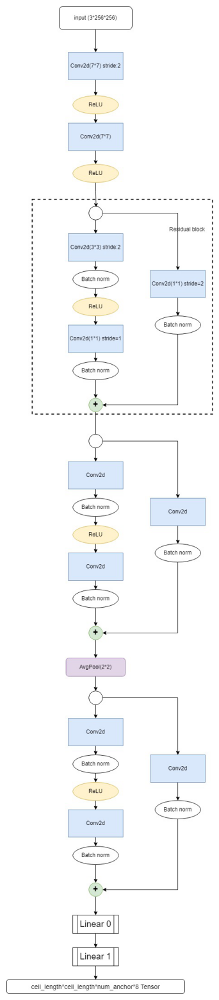

In [ ]:
image=cv2.imread("YOLO_network.jpg")
fig = plt.figure(figsize=(40,20))
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

## Shape of yolo tensor

Length of a cell = 16  
Number of cells in the image = 16 x 16 = 256 cells  
Number of anchor boxes = 11  
Number of classes = 3  

Size of yolo_vec = $\begin{bmatrix} 1 & 8 \end{bmatrix}$

size of my yolo_tensor = $\begin{bmatrix} 16 & 16 & 11 & 8 \end{bmatrix}$

*this is a bit different from prof Kak's code , I have two dimensions for my cell number i.e (x,y) for the cell therefore my yolo_tensor has 4 dimenssions*

In [ ]:
batch_size = 16
anchor_boxes = []
cell_length = 16
ratios = []
for i in range(1,5):
    for j in range(1,5):
        if i/j not in ratios:
            ratios.append(round(i/j,3))
            anchor_boxes.append((cell_length*i , cell_length*j))

print(f"number of anchor boxes = {len(anchor_boxes)}")
print(f"{anchor_boxes} are in ratios {ratios}")
#[(16, 16),
dataloader_train = myDataset("train",img_annotations_train,cell_length,class_map,anchor_boxes)
img,label =  dataloader_train[0]

loader = torch.utils.data.DataLoader(dataloader_train, batch_size=batch_size,shuffle=True)
print(len(loader.dataset))

debug= False
net1 = ConvNet(num_classes=3,debug=debug)
net1 = net1.to( device )
print("~~~~~~~~~~~~~~~~~ Summary of Net1 ~~~~~~~~~~~~~~~~~~")
summary(net1, (3, 256, 256))

criterion1 = nn.BCELoss(reduction='sum')                    # For the first element of the 8 element yolo vector              ## (3)
criterion2 = nn.MSELoss(reduction='sum')                    # For the regression elements (indexed 2,3,4,5) of yolo vector   ## (4)
criterion3 = nn.CrossEntropyLoss(reduction='sum')
epochs = 15
optimizer = torch.optim.Adam(net1.parameters(), lr=1e-4, betas =( 0.9 , 0.99 ))

## Training Process ( explains how batch size > 1 is accomodated)

My training block can train for any number of *batch size* and there is no looping through the batches. In my training code I find the $(B, X_c , Y_c, A)$ index of where the object is in the image and what is its anchor box index using the ground truth yolo_vector's $[0]^{th}$ element.
Using clever indexing I get the yolo_vectors where object is and where there is no object.

For yolo_vectors where there is an object 3 losses are calculated. These are *Binary Cross entrpy loss* , *Regression loss* and *Cross entrpy loss*.
- $P_c$ or yolo_vec[0] Binary Cross entrpy loss is calcuated.  
- $\begin{bmatrix} \delta_x & \delta_y & \sigma_w & \sigma_h \end{bmatrix}$ or yolo_vec[1:5] Regression loss is calcuated.  
- Last $C$ elements i.e yolo_vec[C:] cross entropy is used.

For yolo_vectors where there is no object I only use the $P_c$ value to calcuate the loss and make the model learn the object present-ness.

During my training I have given extra weight to the regression loss as it was not performing well. Giving extra weight to that helped me get better looking bounding boxes.


In [ ]:
epochs=25
num_cells = int(256/cell_length)
num_anchor_boxes = len(anchor_boxes)
debug=False
loss_through_epochs = []
bce_loss = []
reg_loss = []
clf_loss = []
for epoch in range( epochs ):
    running_loss = 0.0
    running_loss_bce = 0.0
    running_loss_reg = 0.0
    running_loss_clf = 0.0
    loss_in_epoch= []
    #print(f" ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ Epoch {epoch+1} ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
    with progressbar.ProgressBar(max_value=len(loader)) as bar:
        for i , data in enumerate(loader):
            #if i>1: break
            inputs, yolo_tensor_gt = data
            #print(f"================ Batch {i} ====================")
            inputs = inputs.to( device )
            #labels = labels.type(torch.DoubleTensor)
            yolo_tensor_gt = yolo_tensor_gt.to( device )
            #cell_index = cell_index.to(device)
            #anchorbox_index = anchorbox_index.to(device)

            #bbox_true = bbox_true.type(torch.DoubleTensor)
            #bbox_true = bbox_true.to(device)
            num_skipped = 0
            optimizer.zero_grad()
            if debug : print(f"Yolo tensor GT iteration {i}: {yolo_tensor_gt.shape}\n")
            outputs = net1(inputs)
            outputs = torch.reshape(outputs , (batch_size , num_cells , num_cells , num_anchor_boxes , 8))
            if debug : print(f"\nOutput size iteration {i}  : {outputs.shape}")
            loss = torch.tensor(0.0, requires_grad=True).float().to(device)


            object_there = torch.where(yolo_tensor_gt[:,:,:,:,0] == 1)
            object_not_there = torch.where(yolo_tensor_gt[:,:,:,:,0] == 0)

            batch_output = outputs[object_there[0],object_there[1],object_there[2],object_there[3]]
            batch_gt = yolo_tensor_gt[object_there[0],object_there[1],object_there[2],object_there[3]]
            bceloss = criterion1(nn.Sigmoid()(batch_output[:,0]) , batch_gt[:,0])
            if debug : print(f"BCE loss = {bceloss.item()}")
            loss += bceloss
            running_loss_bce+= bceloss.item()
#

            regloss1 = criterion2(batch_output[: , 1:3] , batch_gt[: , 1:3])
            regloss2 = criterion2(torch.sqrt(torch.abs(batch_output[: , 3:5])) , torch.sqrt(torch.abs(batch_gt[: , 3:5])))
            #regloss = criterion2(batch_output[: , 1:5] , batch_gt[: , 1:5])
            loss += 2*(regloss1 + regloss2)
            running_loss_reg+=2*(regloss1.item() + regloss2.item())
#
            CEloss = criterion3(batch_output[: , 5:] , batch_gt[: , 5:])
            loss += CEloss
            running_loss_clf+=CEloss.item()
#
            batch_output_not_there = outputs[object_not_there[0],object_not_there[1],object_not_there[2],object_not_there[3]]
            batch_gt_not_there = yolo_tensor_gt[object_not_there[0],object_not_there[1],object_not_there[2],object_not_there[3]]
            #bceloss = criterion1(nn.Sigmoid()(outputs[:,:,:,:,0]) , yolo_tensor_gt[:,:,:,:,0])
            bceloss = criterion1(nn.Sigmoid()(batch_output_not_there[: , 0]) , batch_gt_not_there[: , 0])
            if debug : print(f"BCE loss = {bceloss.item()}")
            loss += bceloss
            running_loss_bce+=bceloss.item()

            ##########################################################################################
            ##########################################################################################

            loss.backward()
            optimizer.step()
            #running_loss += loss.item()
            running_loss+= loss.item()

            num_step_record = 100
            if(i+1)% num_step_record == 0:
                #if (i+1)% 100==0: print(f"[ epoch : {epoch + 1}, batch : {i + 1}] loss : {round(running_loss/num_step_record,3)}")
                loss_in_epoch.append(running_loss/num_step_record)
                bce_loss.append(running_loss_bce/num_step_record)
                reg_loss.append(running_loss_reg/num_step_record)
                clf_loss.append(running_loss_clf/num_step_record)

                running_loss = 0.0
                running_loss_bce = 0.0
                running_loss_reg = 0.0
                running_loss_clf = 0.0

            bar.update(i)
    print(f"Epoch {epoch+1} | Loss : {loss_in_epoch[-1]} | loss bce : {bce_loss[-1]} | loss reg : {reg_loss[-1]} | loss clf : {clf_loss[-1]}" )
    loss_through_epochs.append(loss_in_epoch)

    del inputs
    del yolo_tensor_gt
    del outputs
    gc.collect()

100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 1 | Loss : 225.32093505859376 | loss bce : 128.59134672164916 | loss reg : 74.23075799703598 | loss clf : 22.498829288482668


100% (387 of 387) |######################| Elapsed Time: 0:00:47 Time:  0:00:47
  0% (0 of 387) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

Epoch 2 | Loss : 157.7525527191162 | loss bce : 113.94532539367675 | loss reg : 26.047934663295745 | loss clf : 17.75929281234741


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 3 | Loss : 150.3990008544922 | loss bce : 116.80149085998535 | loss reg : 18.238339877128602 | loss clf : 15.359170818328858


100% (387 of 387) |######################| Elapsed Time: 0:00:48 Time:  0:00:48


Epoch 4 | Loss : 140.55328620910643 | loss bce : 113.54688897132874 | loss reg : 14.854905245304108 | loss clf : 12.151491975784301


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 5 | Loss : 136.03267906188964 | loss bce : 113.06465152740479 | loss reg : 13.078914556503296 | loss clf : 9.889111723899841


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 6 | Loss : 129.81460060119628 | loss bce : 110.68235111236572 | loss reg : 11.099335851669311 | loss clf : 8.032913107872009


100% (387 of 387) |######################| Elapsed Time: 0:00:47 Time:  0:00:47


Epoch 7 | Loss : 127.38804862976075 | loss bce : 111.15525014877319 | loss reg : 9.599297671318054 | loss clf : 6.633500986099243


100% (387 of 387) |######################| Elapsed Time: 0:00:49 Time:  0:00:49


Epoch 8 | Loss : 116.08889381408692 | loss bce : 102.97510517120361 | loss reg : 7.711952615976333 | loss clf : 5.401835548877716


100% (387 of 387) |######################| Elapsed Time: 0:00:48 Time:  0:00:48


Epoch 9 | Loss : 112.99632690429688 | loss bce : 101.20193308830261 | loss reg : 6.934366343021392 | loss clf : 4.860027580261231


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 10 | Loss : 107.71557037353516 | loss bce : 97.32853858947755 | loss reg : 6.143653817176819 | loss clf : 4.243378182649613


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 11 | Loss : 102.4399624633789 | loss bce : 93.39150802612305 | loss reg : 5.454630613327026 | loss clf : 3.593824088573456


100% (387 of 387) |######################| Elapsed Time: 0:00:47 Time:  0:00:47


Epoch 12 | Loss : 95.08629570007324 | loss bce : 87.32115459442139 | loss reg : 4.695452967882156 | loss clf : 3.069687595665455


100% (387 of 387) |######################| Elapsed Time: 0:00:48 Time:  0:00:48


Epoch 13 | Loss : 91.61406806945801 | loss bce : 84.32875809669494 | loss reg : 4.496394991874695 | loss clf : 2.788915419578552


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 14 | Loss : 83.584128074646 | loss bce : 77.03674893379211 | loss reg : 4.216025027036667 | loss clf : 2.3313540130853654


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 15 | Loss : 76.58809753417968 | loss bce : 70.75185831069946 | loss reg : 3.823117847442627 | loss clf : 2.0131211924552916


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 16 | Loss : 69.64833209991455 | loss bce : 64.27351397514343 | loss reg : 3.63703107714653 | loss clf : 1.7377865999937057


100% (387 of 387) |######################| Elapsed Time: 0:00:46 Time:  0:00:46


Epoch 17 | Loss : 60.910043754577636 | loss bce : 55.94618618011474 | loss reg : 3.322684208750725 | loss clf : 1.6411728733778


100% (387 of 387) |######################| Elapsed Time: 0:00:48 Time:  0:00:48


Epoch 18 | Loss : 54.96998950958252 | loss bce : 50.17488496303558 | loss reg : 3.3025241786241533 | loss clf : 1.492580196261406


100% (387 of 387) |######################| Elapsed Time: 0:00:50 Time:  0:00:50


Epoch 19 | Loss : 47.23661947250366 | loss bce : 42.829810433387756 | loss reg : 3.07020128428936 | loss clf : 1.3366080370545388


100% (387 of 387) |######################| Elapsed Time: 0:00:50 Time:  0:00:50


Epoch 20 | Loss : 40.86799385070801 | loss bce : 36.57013883590698 | loss reg : 3.1401852494478226 | loss clf : 1.1576701679825783


100% (387 of 387) |######################| Elapsed Time: 0:00:51 Time:  0:00:51
  0% (0 of 387) |                        | Elapsed Time: 0:00:00 ETA:  --:--:--

Epoch 21 | Loss : 36.78000598907471 | loss bce : 32.66256625175476 | loss reg : 3.0250109320878984 | loss clf : 1.092428886294365


100% (387 of 387) |######################| Elapsed Time: 0:00:51 Time:  0:00:51


Epoch 22 | Loss : 28.940424728393555 | loss bce : 25.220021040439605 | loss reg : 2.8667108184099197 | loss clf : 0.8536927662789822


100% (387 of 387) |######################| Elapsed Time: 0:00:50 Time:  0:00:50


Epoch 23 | Loss : 26.982257108688355 | loss bce : 23.043236000537874 | loss reg : 3.035667925477028 | loss clf : 0.9033531469106674


100% (387 of 387) |######################| Elapsed Time: 0:00:50 Time:  0:00:50


Epoch 24 | Loss : 21.55879726409912 | loss bce : 17.98388640642166 | loss reg : 2.801122806072235 | loss clf : 0.7737881085276603


100% (387 of 387) |######################| Elapsed Time: 0:00:50 Time:  0:00:50


Epoch 25 | Loss : 16.98506175994873 | loss bce : 13.53582585453987 | loss reg : 2.8172607016563416 | loss clf : 0.6319752137362957


## Training loss vs Iteration graphs

It can be seen that the loss decreases beautifully as the model is being trained for more and more iterations.

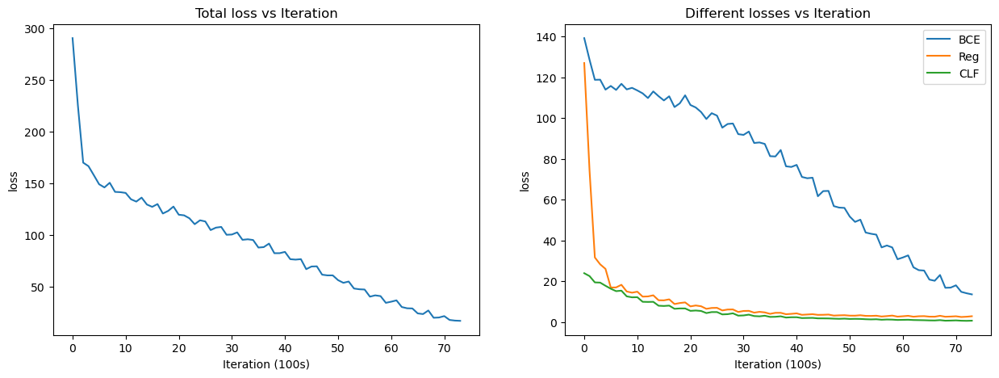

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
loss_throughout = []
for i in loss_through_epochs: loss_throughout.extend(i)
ax[0].plot(loss_throughout[1:])
ax[0].set_title("Total loss vs Iteration")
ax[0].set_ylabel("loss")
ax[0].set_xlabel("Iteration (100s)")

save = True
if save:
    torch.save(net1, "net1")
    with open("bce_loss", "w") as fp: json.dump(bce_loss, fp)
    with open("reg_loss", "w") as fp: json.dump(reg_loss, fp)
    with open("clf_loss", "w") as fp: json.dump(clf_loss, fp)


ax[1].plot(bce_loss[1:] , label = "BCE")
ax[1].plot(reg_loss[1:] , label = "Reg")
ax[1].plot(clf_loss[1:] , label = "CLF")
ax[1].set_title("Different losses vs Iteration")
ax[1].set_ylabel("loss")
ax[1].set_xlabel("Iteration (100s)")
ax[1].legend()
#plt.show()

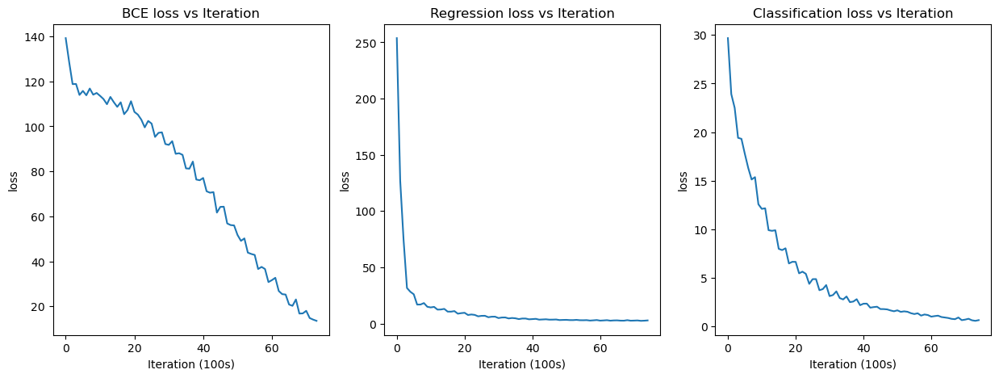

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
ax[0].plot(bce_loss[1:] , label = "BCE")
ax[0].set_title("BCE loss vs Iteration")
ax[0].set_ylabel("loss")
ax[0].set_xlabel("Iteration (100s)")
ax[1].plot(reg_loss , label = "Reg")
ax[1].set_title("Regression loss vs Iteration")
ax[1].set_ylabel("loss")
ax[1].set_xlabel("Iteration (100s)")
ax[2].plot(clf_loss , label = "CLF")
ax[2].set_title("Classification loss vs Iteration")
ax[2].set_ylabel("loss")
ax[2].set_xlabel("Iteration (100s)")
plt.show()


# Inference

Doing inferene from the output of the model is also a very tricky thing to do in YOLO which requirs a lot of hyper-parameter tuining. In my logic for inference and making predicted bounding boxes in the image I reply on the value of $P_c$ which is the object-ness value in a yolo vector. I assume that the greater the object-ness value the more is the probability of the image being there. I find out the *index of yolo_vector* where the object_ness is highest in the whole image. This *index of yolo_vector* gives the (x,y) value of cell and the index of anchor box to be used.

Using the cell location and anchor box location the function *getbbfrom_yolovec()* calculates the top-left value , width and length of the bounding box and that value is printed. In the fucntion the logic of making yolo_vector from bounding box is reversed to get the bounding box from yolo_vector when we know the cell and anchor box index.

In [ ]:
def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0) # only difference

def make_bb(image , objects , true_or_pred):
    if true_or_pred=='true':
        color = (0,1,0)
    else:
        color = (1,1,0)
    for object1 in objects:
        #print(object1)
        [x , y , w , h] = object1['b_box']
        image = cv2.rectangle ( image , (int( x ) , int( y ) ) , (int( x + w ) , int ( y + h ) ) , color , 2 )
        image = cv2.putText ( image , true_or_pred+"_"+object1['category_id'], (int( x ) , int( y - 10 ) ) , cv2.FONT_HERSHEY_SIMPLEX , 1,color , 2 )
    return image

def getbbfrom_yolovec(cell_idx , anchor_box_idx, yolo_bb , cell_length):
    #print(yolo_bb)
    cell_center_x = (cell_idx[0])*cell_length + cell_length/2
    cell_center_y = (cell_idx[1])*cell_length + cell_length/2

    #print(f"cell center = {cell_center_x} and {cell_center_y}")
    obj_center_x = cell_center_x - yolo_bb[0]*cell_length
    obj_center_y = cell_center_y - yolo_bb[1]*cell_length

    #print(f"obj center = {obj_center_x} and {obj_center_y}")
    w , h = anchor_boxes[anchor_box_idx][0]*yolo_bb[2] , anchor_boxes[anchor_box_idx][1]*yolo_bb[3]
    bb_elements = [obj_center_x - w/2 , obj_center_y-h/2 , w, h]
    #print(bb_elements)
    return bb_elements

## Prediction on training images

As it can be seen in the images below , my predictions on the training image are very close to the ground truth bouding boxes and all the classification is also correct. This is one sign of too much training , so there can probably be some overfitting.

IMAGES FROM TRAINING DATA SET


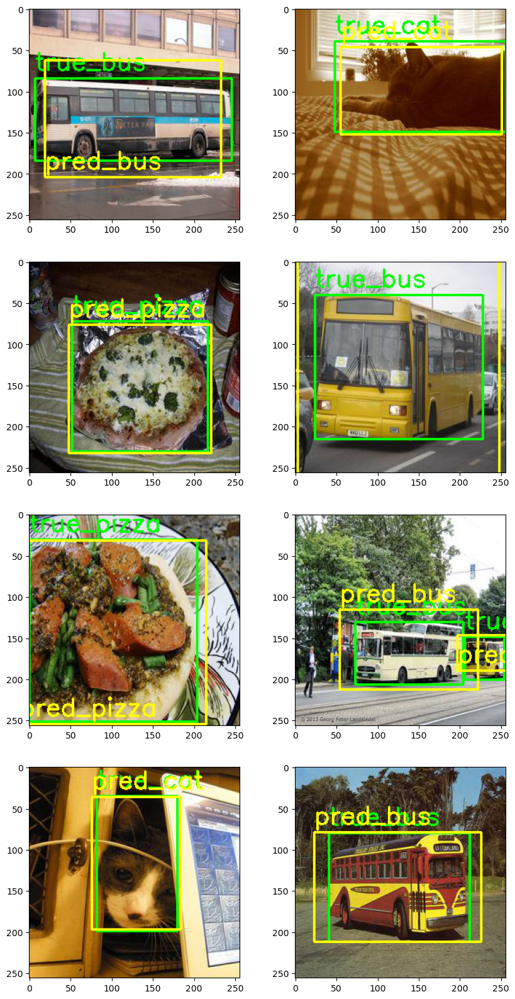

In [ ]:
#dataloader_test = myDataset("val",img_annotations_val,cell_length,class_map,anchor_boxes)
#loader_test = torch.utils.data.DataLoader(dataloader_test, batch_size=1, shuffle=True)
print('IMAGES FROM TRAINING DATA SET')
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(10, 20))
num = 1
for image , yolo_tensor in loader:
    sample_image = np.array(image[0].permute(1, 2, 0)).copy()
    index_img = np.where(yolo_tensor[0][:,:,:,0] == 1)
    object_info = []
    objects = []
    for i in range(len(index_img[0])):
        object_info.append([index_img[0][i] , index_img[1][i] , index_img[2][i]])
        cell_idx = (index_img[0][i],index_img[1][i])
        anchor_box_idx = index_img[2][i]
        yolo_vec = yolo_tensor[0 ,index_img[0][i] , index_img[1][i] , index_img[2][i],:]
        category_idx = np.where(yolo_vec[5:] == 1)
        objects.append({'b_box':getbbfrom_yolovec(cell_idx,anchor_box_idx,yolo_vec[1:5],16) , 'category_id':class_map_rev[category_idx[0][0]]})
    sample_image = make_bb(sample_image,objects,"true")

    num_objects = len(objects)
    image = image.to(device)
    output_tensor = net1(image)
    output_tensor = torch.reshape(output_tensor[0] , [16,16,11,8])
    output_tensor = output_tensor.cpu()
    output_tensor = output_tensor.detach().numpy()
    max_values = np.sort(output_tensor[:,:,:,0].flatten())[-num_objects:]
    objects_pred = []
    for val in np.flip(max_values):
            index_max_prob = np.where(output_tensor[:,:,:,0] == val)
            cell_idx = (index_max_prob[0][0] , index_max_prob[1][0])
            anchor_box_idx = index_max_prob[2][0]
            pred_yolo_vec = output_tensor[index_max_prob[0],index_max_prob[1],index_max_prob[2],:][0]
            category_idx = np.argmax(softmax(output_tensor[index_max_prob[0],index_max_prob[1],index_max_prob[2],5:][0]))
            objects_pred.append({'b_box':getbbfrom_yolovec(cell_idx,anchor_box_idx,pred_yolo_vec[1:5],16) , 'category_id':class_map_rev[category_idx]})
    sample_image = make_bb(sample_image,objects_pred,"pred")
    ax[math.ceil(num/2) -1 , num%2].imshow((sample_image*255).astype('uint8'))
    num = num+1
    if num>8:
        break

## Prediction on VALIDATION/TEST Dataset

Number of cells in row and col = 16
Cell length = 16
Number of total yolo cells = 256
IMAGES FROM VALIDATION DATA SET


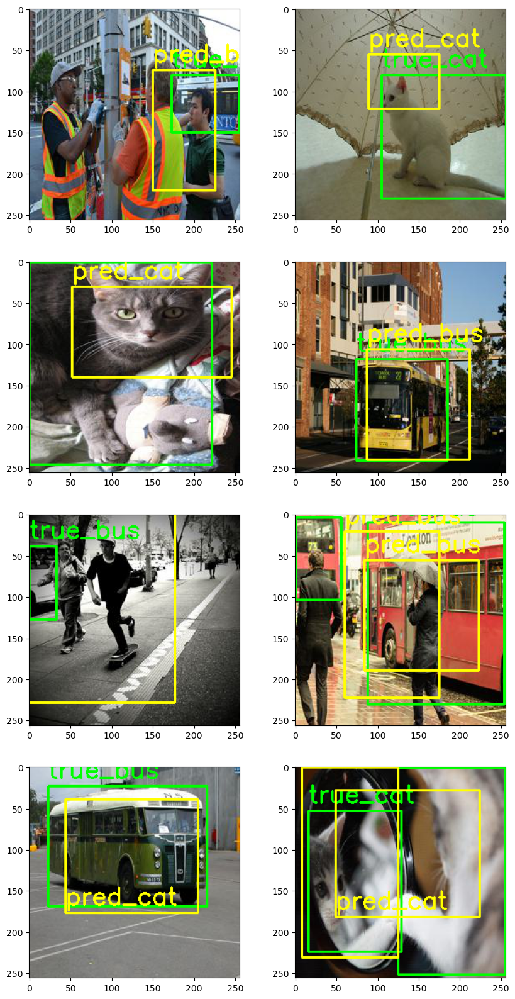

In [ ]:
dataloader_test = myDataset("val",img_annotations_val,cell_length,class_map,anchor_boxes)
net1 = torch.load('net1')
net1.eval()
print('IMAGES FROM VALIDATION DATA SET')

loader_test = torch.utils.data.DataLoader(dataloader_test, batch_size=1, shuffle=True)
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(10, 20))
num = 1
for image , yolo_tensor in loader_test:
    sample_image = np.array(image[0].permute(1, 2, 0)).copy()

    #plt.imshow((sample_image*255).astype('uint8'))
    #print(yolo_tensor.shape)
    #yolo_tensor[0][0][0][0] = torch.tensor([1,2,3,4,5,6,7,8])
    index_img = np.where(yolo_tensor[0][:,:,:,0] == 1)
    object_info = []
    #print("TRUE VALUES")
    objects = []
    for i in range(len(index_img[0])):
        object_info.append([index_img[0][i] , index_img[1][i] , index_img[2][i]])
        #print(index_img[0][i] , index_img[1][i] , index_img[2][i])
        cell_idx = (index_img[0][i],index_img[1][i])
        anchor_box_idx = index_img[2][i]
        yolo_vec = yolo_tensor[0 ,index_img[0][i] , index_img[1][i] , index_img[2][i],:]
        category_idx = np.where(yolo_vec[5:] == 1)
        #print(category_idx[0][0])
        #print(yolo_tensor[0 ,index_img[0][i] , index_img[1][i] , index_img[2][i],5:])
        objects.append({'b_box':getbbfrom_yolovec(cell_idx,anchor_box_idx,yolo_vec[1:5],16) , 'category_id':class_map_rev[category_idx[0][0]]})
    sample_image = make_bb(sample_image,objects,"true")

    num_objects = len(objects)
    #print("==============================================================")
    image = image.to(device)
    output_tensor = net1(image)
    #print(output_tensor.shape)
    output_tensor = torch.reshape(output_tensor[0] , [16,16,11,8])
    #output_tensor[:,:,:,5:] = nn.Softmax(output_tensor[:,:,:,5:])
    output_tensor = output_tensor.cpu()
    output_tensor = output_tensor.detach().numpy()
    max_values = np.sort(output_tensor[:,:,:,0].flatten())[-num_objects:]
    #print(max_values.shape)
    #print(max_values)
    objects_pred = []
    for val in np.flip(max_values):
        #if val > 15:
            index_max_prob = np.where(output_tensor[:,:,:,0] == val)
            cell_idx = (index_max_prob[0][0] , index_max_prob[1][0])
            anchor_box_idx = index_max_prob[2][0]
            pred_yolo_vec = output_tensor[index_max_prob[0],index_max_prob[1],index_max_prob[2],:][0]
            category_idx = np.argmax(softmax(output_tensor[index_max_prob[0],index_max_prob[1],index_max_prob[2],5:][0]))
            objects_pred.append({'b_box':getbbfrom_yolovec(cell_idx,anchor_box_idx,pred_yolo_vec[1:5],16) , 'category_id':class_map_rev[category_idx]})
    sample_image = make_bb(sample_image,objects_pred,"pred")
    ax[math.ceil(num/2) -1 , num%2].imshow((sample_image*255).astype('uint8'))
    #ax[math.ceil(num/2) -1 , num%2].set_title(
    num = num+1
    if num>8:
        break

# Discussion

My implemenation of YOLO is fast and also works for any batch size without looping through each image in the batch. If the predictions on the validation data is seen. The bounding boxes are sort of near the true one. If they are worng they just appear in the middle, so what the network prefers is making the middle cells more likely than the cells in the corners so that has to be worked on. If my network is longer and more complex I fell the overfitting can be reduced. Another idea can be to distributed the objectness probabilities somewwhat uniformly while training so that that the center cells are less preferred.

In my inference cell there can be some more hyperparameter tuining where I can find some kind of threshold which tells me how much yolo_vectors for objects to be considered.